<a href="https://colab.research.google.com/github/Divya-Gajjar/Colab_repository/blob/master/Telecom_Churn_Prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Telecom Churn Notebook**

Customer attrition, also known as customer churn, customer turnover, or customer defection, is the loss of clients or customers.

Telephone service companies, Internet service providers, pay TV companies, insurance firms, and alarm monitoring services, often use customer attrition analysis and customer attrition rates as one of their key business metrics because the cost of retaining an existing customer is far less than acquiring a new one. Companies from these sectors often have customer service branches which attempt to win back defecting clients, because recovered long-term customers can be worth much more to a company than newly recruited clients.

predictive analytics use churn prediction models that predict customer churn by assessing their propensity of risk to churn. Since these models generate a  prioritized list of potential defectors, they are effective at focusing customer retention marketing programs on the subset of the customer base who are most vulnerable to churn.

Importing the Inbuild libaries of machine learning



In [0]:
import pandas as pd
import sklearn as sk
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sn

Read the data into the variable df

In [0]:
df = pd.read_csv('/content/telecomchurn.csv')

## **Preprocessing function:** 


*   Fill the numeric null values with Mean
*   Remove the remaining objective null values

*   Label Encoding the object values  








In [0]:
def preprocessing():
  global df
  print("\n\nbefore preprocessing total numbers of null values\n")
  print(df.isnull().sum())
  df=df.fillna(df.mean())
  print("\n\nreplacing null numeric values with mean\n")
  print(df.isnull().sum())
  print("\n\ndroping non-numeric null values\n")
  df = df.dropna()
  print(df.isnull().sum())



  from sklearn import preprocessing
  le = preprocessing.LabelEncoder()

  #Encoding the Object values of the data

  df['ServiceArea'] = df['ServiceArea'].astype(str)
  df['ServiceArea']= le.fit_transform(df['ServiceArea'])  
  df['Churn']= le.fit_transform(df['Churn']) 
  df['ChildrenInHH']= le.fit_transform(df['ChildrenInHH']) 
  df['HandsetRefurbished']= le.fit_transform(df['HandsetRefurbished']) 
  df['HandsetWebCapable']= le.fit_transform(df['HandsetWebCapable'])  
  df['TruckOwner']= le.fit_transform(df['TruckOwner'])  
  df['RVOwner']= le.fit_transform(df['RVOwner'])  
  df['Homeownership']= le.fit_transform(df['Homeownership'])  
  df['BuysViaMailOrder']= le.fit_transform(df['BuysViaMailOrder'])  
  df['RespondsToMailOffers']= le.fit_transform(df['RespondsToMailOffers'])
  df['OptOutMailings']= le.fit_transform(df['OptOutMailings'])   
  df['NonUSTravel']= le.fit_transform(df['NonUSTravel'])   
  df['OwnsComputer']= le.fit_transform(df['OwnsComputer'])  
  df['HasCreditCard']= le.fit_transform(df['HasCreditCard']) 
  df['NewCellphoneUser']= le.fit_transform(df['NewCellphoneUser'])
  df['NotNewCellphoneUser']= le.fit_transform(df['NotNewCellphoneUser'])
  df['OwnsMotorcycle']= le.fit_transform(df['OwnsMotorcycle'])
  df['HandsetPrice']= le.fit_transform(df['HandsetPrice'])
  df['MadeCallToRetentionTeam']= le.fit_transform(df['MadeCallToRetentionTeam'])
  df['CreditRating']= le.fit_transform(df['CreditRating'])
  df['PrizmCode']= le.fit_transform(df['PrizmCode'])
  df['Occupation']= le.fit_transform(df['Occupation'])
  df['MaritalStatus']= le.fit_transform(df['MaritalStatus'])

  print("\n\n Ater Encoding the Object values of the data", df.dtypes,"\n")
  return;

preprocessing()




before preprocessing total numbers of null values

CustomerID                     0
Churn                          0
MonthlyRevenue               156
MonthlyMinutes               156
TotalRecurringCharge         156
DirectorAssistedCalls        156
OverageMinutes               156
RoamingCalls                 156
PercChangeMinutes            367
PercChangeRevenues           367
DroppedCalls                   0
BlockedCalls                   0
UnansweredCalls                0
CustomerCareCalls              0
ThreewayCalls                  0
ReceivedCalls                  0
OutboundCalls                  0
InboundCalls                   0
PeakCallsInOut                 0
OffPeakCallsInOut              0
DroppedBlockedCalls            0
CallForwardingCalls            0
CallWaitingCalls               0
MonthsInService                0
UniqueSubs                     0
ActiveSubs                     0
ServiceArea                   24
Handsets                       1
HandsetModels          

### Assigning the values of x and target variable y from the df

In [0]:
x = df[['MonthlyRevenue', 'MonthlyMinutes',
       'TotalRecurringCharge', 'DirectorAssistedCalls', 'OverageMinutes',
       'RoamingCalls', 'PercChangeMinutes', 'PercChangeRevenues',
       'DroppedCalls', 'BlockedCalls', 'UnansweredCalls', 'CustomerCareCalls',
       'ThreewayCalls', 'ReceivedCalls', 'OutboundCalls', 'InboundCalls',
       'PeakCallsInOut', 'OffPeakCallsInOut', 'DroppedBlockedCalls',
       'CallForwardingCalls', 'CallWaitingCalls', 'MonthsInService',
       'UniqueSubs', 'ActiveSubs', 'ServiceArea', 'Handsets', 'HandsetModels',
       'CurrentEquipmentDays', 'AgeHH1', 'AgeHH2', 'ChildrenInHH',
       'HandsetRefurbished', 'HandsetWebCapable', 'TruckOwner', 'RVOwner',
       'Homeownership', 'BuysViaMailOrder', 'RespondsToMailOffers',
       'OptOutMailings', 'NonUSTravel', 'OwnsComputer', 'HasCreditCard',
       'RetentionCalls', 'RetentionOffersAccepted', 'NewCellphoneUser',
       'NotNewCellphoneUser', 'ReferralsMadeBySubscriber', 'IncomeGroup',
       'OwnsMotorcycle', 'AdjustmentsToCreditRating', 'HandsetPrice',
       'MadeCallToRetentionTeam', 'CreditRating', 'PrizmCode', 'Occupation',
       'MaritalStatus']]
y = df[['Churn']]

## Pair Plot Graph of all the features of dataset with each other

As you can see there's no linearity in this dataset so can't use any linear classification models, have to use tree based models.

In [0]:
sn.pairplot(df, hue='Churn')

## **Functions of Decision Tree, Random Forest and AdaBoost classifiers** 

Functions are consist of:
*   Accuracy of models
*   Prediction of the Churn

*   Classification Report
*   Confusion Matrix

*   Cross Validation Mean Score Of the model









In [0]:
def decision_tree():
  global dec_clf
  from sklearn.model_selection import train_test_split
  xtrain, xtest, ytrain, ytest = train_test_split(x, y, test_size = 0.3, shuffle = True)
  
  from sklearn import tree
  dec_clf = tree.DecisionTreeClassifier().fit(xtrain, ytrain)
  print("\n**Decision Tree**\n")
  
  print('train accuracy',dec_clf.score(xtrain,ytrain))
  print('test accuracy',dec_clf.score(xtest,ytest))
 
  y_pred = dec_clf.predict(xtest)
  
  from sklearn.metrics import classification_report, confusion_matrix
  print("classification report :  \n ", classification_report(ytest, y_pred))

  print("confusion matrix:\n",confusion_matrix(ytest,y_pred))
  confusion_matrix = confusion_matrix(ytest, y_pred)  

  from sklearn.model_selection import cross_val_score
  cv = cross_val_score(dec_clf,x,y,cv=10)
  print('\nCross validation of Decision Tree:  ',cv.mean())
  
  return;


def random_forest():
  global random_clf, xtrain, xtest, ytrain, ytest
  from sklearn.model_selection import train_test_split
  xtrain, xtest, ytrain, ytest = train_test_split(x, y, test_size = 0.3, shuffle = True)
  from sklearn.ensemble import RandomForestClassifier
  random_clf = RandomForestClassifier(max_depth=15, random_state=0)
  random_clf.fit(xtrain,ytrain)
  print("\n**Random forest**\n")
  
  print('train accuracy',random_clf.score(xtrain,ytrain))
  print('test accuracy',random_clf.score(xtest,ytest))
  
  y_pred = random_clf.predict(xtest)
  
  from sklearn.metrics import classification_report, confusion_matrix
  print("classification report :  \n ", classification_report(ytest, y_pred))

  print("confusion matrix:\n",confusion_matrix(ytest,y_pred))
  confusion_matrix = confusion_matrix(ytest, y_pred)  
  
  from sklearn.model_selection import cross_val_score
  cv = cross_val_score(random_clf,x,y,cv=10)
  print('\nCross validation of random forest:  ',cv.mean())
  
  return;



def adaboost():
  global adaboost_clf, xtrain, xtest, ytrain, ytest

  from sklearn.model_selection import train_test_split  
  xtrain,xtest,ytrain,ytest=train_test_split(x,y,test_size=0.3,shuffle=True)

  from sklearn.tree import DecisionTreeClassifier
  from sklearn.ensemble import AdaBoostClassifier,RandomForestClassifier

  adaboost_clf = AdaBoostClassifier(RandomForestClassifier())
  adaboost_clf.fit(xtrain,ytrain)

  print("\n\n **AdaBoost Classifier**\n")
  print('training:',adaboost_clf.score(xtrain,ytrain))
  print('test:',adaboost_clf.score(xtest,ytest))    
  y_pred = adaboost_clf.predict(xtest)

  from sklearn.metrics import precision_recall_fscore_support
  print('precision_recall_fscore_support\n',precision_recall_fscore_support(ytest, y_pred, average=None),'\n')

  from sklearn.metrics import classification_report
  print('classification_report\n',classification_report(ytest,y_pred),'\n')

  from sklearn.metrics import confusion_matrix
  print('confusion_matrix\n',confusion_matrix(ytest,y_pred))

  from sklearn.model_selection import cross_val_score
  cv = cross_val_score(adaboost_clf,x,y,cv=10)
  print('\nCross validation of adaboost:  ',cv.mean())
  
  return;

## Excecuting the functions and checking out the scores, prediction recall of the models

Recall of the class 1 by every model is very low, which can not be validate because neither of the models is not able to find out the class 1

To get the high recall for class one firstly have to check the class distribution and then have to perform some task to increase the recall

In [0]:
decision_tree()
random_forest()
adaboost()

/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)



**Logistic Regression**

train accuracy 0.7127337887781386
test accuracy 0.7035343306983733
classification report :  
                precision    recall  f1-score   support

           0       0.71      1.00      0.83     10794
           1       0.34      0.01      0.01      4513

    accuracy                           0.70     15307
   macro avg       0.52      0.50      0.42     15307
weighted avg       0.60      0.70      0.59     15307

confusion matrix:
 [[10743    51]
 [ 4487    26]]

**Decision Tree**

train accuracy 1.0
test accuracy 0.6242242111452276
classification report :  
                precision    recall  f1-score   support

           0       0.74      0.73      0.73     10903
           1       0.35      0.37      0.36      4404

    accuracy                           0.62     15307
   macro avg       0.55      0.55      0.55     15307
weighted avg       0.63      0.62      0.63     15307

confusion matrix:
 [[7929 2974]
 [2778 1626]]


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:54: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



**Random forest**

train accuracy 0.8265763243364318
test accuracy 0.7173188737179068
classification report :  
                precision    recall  f1-score   support

           0       0.72      0.99      0.83     10875
           1       0.63      0.06      0.10      4432

    accuracy                           0.72     15307
   macro avg       0.68      0.52      0.47     15307
weighted avg       0.69      0.72      0.62     15307

confusion matrix:
 [[10729   146]
 [ 4181   251]]


/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)




 AdaBoost Classifier

training: 1.0
test: 0.7265303455935193
precision_recall_fscore_support
 (array([0.73280207, 0.5792    ]), array([0.97613863, 0.08448075]), array([0.83714597, 0.14745418]), array([11022,  4285])) 

classification_report
               precision    recall  f1-score   support

           0       0.73      0.98      0.84     11022
           1       0.58      0.08      0.15      4285

    accuracy                           0.73     15307
   macro avg       0.66      0.53      0.49     15307
weighted avg       0.69      0.73      0.64     15307
 

confusion_matrix
 [[10759   263]
 [ 3923   362]]


## Reason for getting low Recall of the models is because of the class imbalance

This bias in the training dataset can influence many machine learning algorithms, leading some to ignore the minority class entirely. This is a problem as it is typically the minority class on which predictions are most important.

Text(0.5, 1.0, 'Churn\n(0 :No Churn||1: Churn)')

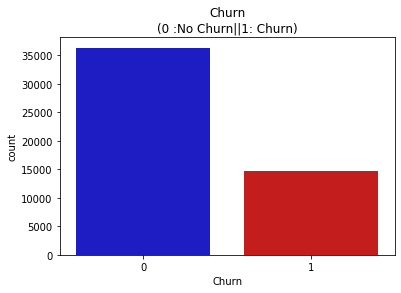

In [0]:
colors = ["#0101DF","#DF0101"]
sn.countplot('Churn',data = df,palette=colors)
plt.title("Churn\n(0 :No Churn||1: Churn)")

# **Increasing the Recall using Imbalance class techniques like Over Sampling and SMOTEENN(combine of the over and under sampling)**

## Used over sampling method to increase the Recall of the class 1 and also plot the distribution of the class after over sampling method



/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)



**Decision Tree**

train accuracy 1.0
test accuracy 0.7745354439091535
classification report :  
                precision    recall  f1-score   support

           0       0.85      0.68      0.75     11011
           1       0.73      0.88      0.79     10784

    accuracy                           0.77     21795
   macro avg       0.79      0.78      0.77     21795
weighted avg       0.79      0.77      0.77     21795

confusion matrix:
 [[7441 3570]
 [1344 9440]]

Cross validation of Decision Tree:   0.759225324863339

**Random forest**

train accuracy 0.9259630700253673
test accuracy 0.7645331498050012
classification report :  
                precision    recall  f1-score   support

           0       0.81      0.69      0.74     10837
           1       0.73      0.84      0.78     10958

    accuracy                           0.76     21795
   macro avg       0.77      0.76      0.76     21795
weighted avg       0.77      0.76      0.76     21795

confusion matrix:
 [[7452 338

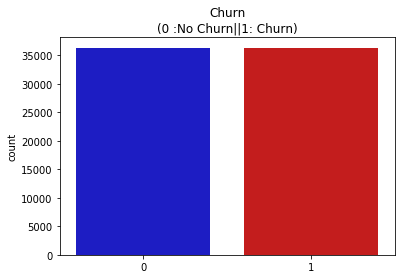

In [0]:
from imblearn.over_sampling import RandomOverSampler
over_sample = RandomOverSampler(sampling_strategy='minority')
x, y = over_sample.fit_resample(x, y)

colors = ["#0101DF","#DF0101"]
sn.countplot(y,data = df,palette=colors)
plt.title("Churn\n(0 :No Churn||1: Churn)")

decision_tree()
random_forest()
adaboost()

## Used SMOTEENN sampling method to increase the Recall of the class 1 and also plot the distribution of the class after SMOTEENN sampling method

This method gives the highest recall and also not affecting the precision.

AdaBoost model fits the best and aalso predicting the classes right.

/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=F


**Decision Tree**

train accuracy 1.0
test accuracy 0.784297891431135
classification report :  
                precision    recall  f1-score   support

           0       0.65      0.66      0.66      3460
           1       0.85      0.84      0.84      7685

    accuracy                           0.78     11145
   macro avg       0.75      0.75      0.75     11145
weighted avg       0.79      0.78      0.78     11145

confusion matrix:
 [[2289 1171]
 [1233 6452]]

Cross validation of Decision Tree:   0.7367399407574264

**Random forest**

train accuracy 0.971619750807568
test accuracy 0.8410946612830866
classification report :  
                precision    recall  f1-score   support

           0       0.79      0.68      0.73      3521
           1       0.86      0.92      0.89      7624

    accuracy                           0.84     11145
   macro avg       0.82      0.80      0.81     11145
weighted avg       0.84      0.84      0.84     11145

confusion matrix:
 [[2390 1131

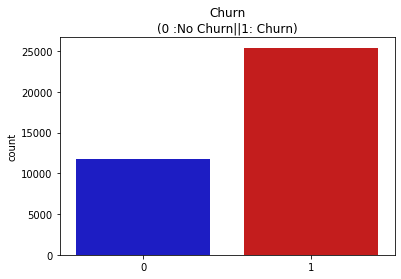

In [0]:
from imblearn.combine import SMOTEENN
SMOTEEN_sample=SMOTEENN(sampling_strategy='auto')
x,y = SMOTEEN_sample.fit_resample(x,y)


colors = ["#0101DF","#DF0101"]
sn.countplot(y,data = df,palette=colors)
plt.title("Churn\n(0 :No Churn||1: Churn)")

decision_tree()
random_forest()
adaboost()

# Conclusion: 

Inbalance Class classificaation methods applied to the data to increace the recall. After that  in Telecom churn detection AdaBoost and Random forest are the Best perfomed models because it gives the high accuracy and what matters the most in this business kind of problem statment is good recall, so these models are  good at identifying the True negative and True positive.
